In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns

from copy import deepcopy

from key_door import key_door_env, visualisation_env
from sac.models import dqn, ppo
from sac import utils, binary_maze

from sklearn.metrics.pairwise import cosine_similarity

In [2]:
dqn_map_path = '../sac/maps/meister_maze.txt'
dqn_map_yaml_path = '../sac/maps/test_meister_maze.yaml'

ppo_map_path = '../sac/maps/meister_trimmed.txt'
ppo_map_yaml_path = '../sac/maps/test_meister_trimmed.yaml'

In [3]:
dqn_env = key_door_env.KeyDoorEnv(map_ascii_path=dqn_map_path, map_yaml_path=dqn_map_yaml_path, representation="pixel", episode_timeout=200)
dqn_env = visualisation_env.VisualisationEnv(dqn_env)

ppo_env = key_door_env.KeyDoorEnv(map_ascii_path=ppo_map_path, map_yaml_path=ppo_map_yaml_path, representation="pixel", episode_timeout=200)
ppo_env = visualisation_env.VisualisationEnv(ppo_env)

In [4]:
dqn_sample_state = dqn_env.reset_environment(train=False)
dqn_state_space = dqn_env.state_space
dqn_action_space = dqn_env.action_space
dqn_num_actions = len(dqn_action_space)
dqn_state_shape = dqn_sample_state.shape[1:]

ppo_sample_state = ppo_env.reset_environment(train=False)
ppo_state_space = ppo_env.state_space
ppo_action_space = ppo_env.action_space
ppo_num_actions = len(ppo_action_space)
ppo_state_shape = ppo_sample_state.shape[1:]

In [5]:
dqn_env_image = dqn_env._env._env_skeleton(
                    rewards="state",
                    agent="state",
                    cue="state",
                )

ppo_env_image = ppo_env._env._env_skeleton(
                    rewards="state",
                    agent="state",
                    cue="state",
                )

In [6]:
# find white pixels
white_pixels = np.where(np.all(dqn_env_image == [1, 1, 1], axis=-1))
white_pixel_coords = list(zip(white_pixels[0], white_pixels[1]))

# find black pixels
black_pixels = np.where(np.all(dqn_env_image == [0, 0, 0], axis=-1))
black_pixel_coords = list(zip(black_pixels[0], black_pixels[1]))

dqn_env_image[white_pixels] = [0.0, 0.0, 0.0]
dqn_env_image[black_pixels] = [1.0, 1.0, 1.0]

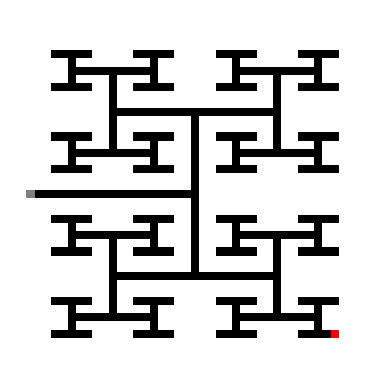

In [7]:
plt.imshow(dqn_env_image, origin="lower", aspect='equal')
plt.axis('off')

plt.savefig('environment.png', bbox_inches='tight', pad_inches=0)
plt.savefig('environment.pdf', bbox_inches='tight', pad_inches=0)

In [8]:
dqn_pos_env = key_door_env.KeyDoorEnv(map_ascii_path=dqn_map_path, map_yaml_path=dqn_map_yaml_path, representation="agent_position", episode_timeout=200)
ppo_pos_env = key_door_env.KeyDoorEnv(map_ascii_path=ppo_map_path, map_yaml_path=ppo_map_yaml_path, representation="agent_position", episode_timeout=200)

dqn_state_id_mapping = {state: i for i, state in enumerate(dqn_pos_env.positional_state_space)}
dqn_id_state_mapping = {i: state for i, state in enumerate(dqn_pos_env.positional_state_space)}
ppo_state_id_mapping = {state: i for i, state in enumerate(ppo_pos_env.positional_state_space)}
ppo_id_state_mapping = {i: state for i, state in enumerate(ppo_pos_env.positional_state_space)}

S_dqn = len(dqn_pos_env.positional_state_space)
A_dqn = len(dqn_pos_env.action_space)
S_ppo = len(ppo_pos_env.positional_state_space)
A_ppo = len(ppo_pos_env.action_space)

P_dqn = np.zeros((S_dqn, A_dqn, S_dqn))
R_dqn = np.zeros((S_dqn, A_dqn))
P_ppo = np.zeros((S_ppo, A_ppo, S_ppo))
R_ppo = np.zeros((S_ppo, A_ppo))

dqn_reward_positions = list(dqn_pos_env._rewards.keys())
ppo_reward_positions = list(ppo_pos_env._rewards.keys())

for state in dqn_pos_env.positional_state_space:
    state_index = dqn_state_id_mapping[state]
    if state not in dqn_reward_positions:
        for action in dqn_pos_env.action_space:
            # set env and transition
            dqn_pos_env.reset_environment(train=True)
            dqn_pos_env.move_agent_to(state)
            reward, new_state = dqn_pos_env.step(action)
            if reward > 0:
                print(f"From state {state} taking action {action} to state {new_state} with reward {reward}")
            # import pdb; pdb.set_trace()
            new_state_index = dqn_state_id_mapping[new_state[:2]]
            P_dqn[state_index][action][new_state_index] = 1
            R_dqn[state_index][action] = reward

for state in ppo_pos_env.positional_state_space:
    state_index = ppo_state_id_mapping[state]
    if state not in ppo_reward_positions:
        for action in ppo_pos_env.action_space:
            # set env and transition
            ppo_pos_env.reset_environment(train=True)
            ppo_pos_env.move_agent_to(state)
            reward, new_state = ppo_pos_env.step(action)
            if reward > 0:
                print(f"From state {state} taking action {action} to state {new_state} with reward {reward}")
            # import pdb; pdb.set_trace()
            new_state_index = ppo_state_id_mapping[new_state[:2]]
            P_ppo[state_index][action][new_state_index] = 1
            R_ppo[state_index][action] = reward

From state (np.int64(38), np.int64(5)) taking action 2 to state (np.int64(39), np.int64(5), np.int64(1)) with reward 0.8704685148500576
From state (np.int64(34), np.int64(1)) taking action 2 to state (np.int64(35), np.int64(1), np.int64(1)) with reward 0.9795160139027914


In [9]:
dqn_state_blocks, dqn_sa_blocks, dqn_state_label, dqn_sa_label, dqn_P_tilde, dqn_R_tilde, dqn_action_index_per_block = utils.joint_state_action_abstraction(P_dqn, R_dqn)
dqn_state_to_label = {dqn_id_state_mapping[i]: dqn_state_label[i] for i in range(len(dqn_state_label))}

ppo_state_blocks, ppo_sa_blocks, ppo_state_label, ppo_sa_label, ppo_P_tilde, ppo_R_tilde, ppo_action_index_per_block = utils.joint_state_action_abstraction(P_ppo, R_ppo)
ppo_state_to_label = {ppo_id_state_mapping[i]: ppo_state_label[i] for i in range(len(ppo_state_label))}

In [10]:
# create a dictionary mapping state coordinate tuple to state label
dqn_state_to_label = {dqn_id_state_mapping[i]: dqn_state_label[i] for i in range(len(dqn_state_label))}
ppo_state_to_label = {ppo_id_state_mapping[i]: ppo_state_label[i] for i in range(len(ppo_state_label))}

dqn_env.plot_heatmap_over_env(dqn_state_to_label, save_name='state_aggregation.pdf')
dqn_env.plot_heatmap_over_env(dqn_state_to_label, save_name='state_aggregation.png')

# env.plot_heatmap_over_env(state_to_label, save_name='state_aggregation_trimmed.png')

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


In [11]:
def plot_rsa_matrix(reprs, title):
    reprs_ = reprs - reprs.mean(axis=0)
    rsa_matrix = cosine_similarity(reprs_)  # Shape: (S, S)
    plt.figure(figsize=(10, 8))
    plt.imshow(rsa_matrix, cmap='viridis')
    plt.colorbar(label='Cosine Similarity')
    plt.title(title)
    plt.xlabel('State Index')
    plt.ylabel('State Index')
    plt.show()

    return rsa_matrix

In [12]:
def calculate_participation_ratio(reprs):
    cov_matrix = np.cov(reprs, rowvar=False)
    eigenvalues, _ = np.linalg.eig(cov_matrix)
    # print(f"Eigenvalues: {eigenvalues}")
    participation_ratio = (np.sum(eigenvalues) ** 2) / np.sum(eigenvalues ** 2)
    return participation_ratio

In [13]:
def get_mean_off_diagonal(rsa_matrix):
    n = rsa_matrix.shape[0]
    off_diagonal_sum = np.sum(rsa_matrix) - np.sum(np.diag(rsa_matrix))
    num_off_diagonal_elements = n * (n - 1)
    mean_off_diagonal = off_diagonal_sum / num_off_diagonal_elements
    return mean_off_diagonal

In [14]:
def get_within_label_similarity(reprs, state_to_label, state_id_mapping):
    sims_same_label = []
    counts_same_label = []

    for label in set(state_to_label.values()):
        states_with_label = [state for state, lbl in state_to_label.items() if lbl == label]
        if len(states_with_label) < 2:
            continue
        indices = [state_id_mapping[state] for state in states_with_label]
        if len(indices) < 2:
            continue
        reprs_subset = reprs[indices]
        sim_matrix = cosine_similarity(reprs_subset - reprs.mean(axis=0))
        sim_mean = get_mean_off_diagonal(sim_matrix)
        sims_same_label.append(sim_mean)
        counts_same_label.append(len(states_with_label))

    # calculate weighted mean
    weights = np.array(counts_same_label) / np.sum(counts_same_label) if counts_same_label else []
    weighted_mean = np.average(sims_same_label, weights=weights) if counts_same_label else 0
    
    return weighted_mean

## DQN

In [15]:
results_path = "../sac/results/2025-06-10-21-13"
args_text = open(f"{results_path}/args.txt", "r").read()
print(args_text)

model: dqn
learning_rate: 0.0003
discount_factor: 0.99
exploration_rate: 1.0
optimistic_init: 10.0
exploration_decay: 0.995
num_episodes: 10000
num_steps: 100000
batch_size: 64
target_update_frequency: 50
replay_buffer_size: 50000
burnin: 5000
gae_lambda: 0.95
update_epochs: 10
value_function_coef: 0.5
entropy_coef: 0.01
clip_coef: 0.2
max_grad_norm: 0.5
convolutional: True
test_frequency: 50
save_model_frequency: 50
visualisation_frequency: 50
map_name: meister_maze.txt
map_yaml_filename: meister_maze.yaml
test_map_yaml_filename: test_meister_maze.yaml
representation: pixel
episode_timeout: 200
results_dir: results



In [16]:
dqn_model = dqn.DQN(
    sample_state=dqn_sample_state,
    num_actions=dqn_num_actions,
    learning_rate=0.0,
    discount_factor=0.99,
    exploration_rate=0.01,
    exploration_decay=1.0,
    batch_size=64,
    target_update_frequency=1000,
    replay_buffer_size=10000,
    burnin=1000,
    convolutional=True,
    optimistic_init=False
)

dqn_model_init = deepcopy(dqn_model)

In [17]:
# get representations
def get_representations(model, states):
    model._net.eval()
    network = model._net
    states = torch.tensor(states, dtype=torch.float32).to('cuda')
    with torch.no_grad():
        x = torch.relu(network.conv1(states))
        x = torch.relu(network.conv2(x))
        conv_x = x.view(x.size(0), -1)  # Flatten
        x1 = torch.relu(network.fc1(conv_x))
        x2 = torch.relu(network.fc2(x1))
        qvals = network.fc3(x2)
        vals = torch.max(qvals, dim=1).values
        action = torch.argmax(qvals, dim=1)
    return conv_x, x1, x2, vals, action

In [18]:
def accumulate_and_plot(model, env):
    conv_reprs = []
    shared_reprs_1 = []
    shared_reprs_2 = []
    state_reprs = []
    values = []
    policy = []

    i = 0

    state_id_mapping = {state: i for i, state in enumerate(env.positional_state_space)}
    id_state_mapping = {i: state for i, state in enumerate(env.positional_state_space)}
    state_to_value = {id_state_mapping[i]: 0.0 for i in range(len(env.positional_state_space))}
    state_to_policy = {id_state_mapping[i]: 0.0 for i in range(len(env.positional_state_space))}

    for state in env.positional_state_space:
        env.move_agent_to(state)  # Move agent to position
        state_input = env.get_state_representation()
        shape = (1, ) + dqn_state_shape
        state_input = torch.FloatTensor(state_input.reshape(shape)).to('cuda')
        conv, shared_1, shared_2, vals, actions = get_representations(model, state_input)
        conv_reprs.append(conv.cpu().numpy())
        shared_reprs_1.append(shared_1.cpu().numpy())
        shared_reprs_2.append(shared_2.cpu().numpy())
        state_reprs.append(state_input.cpu().numpy())
        values.append(vals.cpu().numpy())
        policy.append(actions.cpu().numpy())
        state_to_value[state] = vals.item()
        state_to_policy[state] = actions.item()

    conv_reprs = np.vstack(conv_reprs)  # Shape: (S, convolutional_representation_dim)
    shared_reprs_1 = np.vstack(shared_reprs_1)  # Shape: (S, representation_dim_1)
    shared_reprs_2 = np.vstack(shared_reprs_2)  # Shape: (S, representation_dim_2)
    state_reprs = np.vstack(state_reprs).reshape(len(state_reprs), -1)  # Shape: (S, state_representation_dim)
    values = np.hstack(values)  # Shape: (S,)
    policy = np.hstack(policy)  # Shape: (S,)

    print("Input State Representation Shape:", state_reprs.shape)
    print("Convolutional Representation Shape:", conv_reprs.shape)
    print("First MLP Representation Shape:", shared_reprs_1.shape, "Participation Ratio:", calculate_participation_ratio(shared_reprs_1))
    print("Second MLP Representation Shape:", shared_reprs_2.shape, "Participation Ratio:", calculate_participation_ratio(shared_reprs_2))
    print("Values Shape:", values.shape, "Min:", np.min(values), "Max:", np.max(values), "Mean:", np.mean(values))
    print("Policy Shape:", policy.shape, "Min:", np.min(policy), "Max:", np.max(policy), "Mean:", np.mean(policy))

    state_repr_rsa = plot_rsa_matrix(state_reprs, "Input State Representation RSA Matrix")
    conv_rsa = plot_rsa_matrix(conv_reprs, "Convolutional Representation RSA Matrix")
    shared_1_rsa = plot_rsa_matrix(shared_reprs_1, "First MLP Representation RSA Matrix")
    shared_2_rsa = plot_rsa_matrix(shared_reprs_2, "Second MLP Representation RSA Matrix")

    env.plot_heatmap_over_env(state_to_value, save_name='dqn_values.pdf')
    env.plot_heatmap_over_env(state_to_value, save_name='dqn_values.png')

    cmap = plt.get_cmap('viridis')
    env.plot_heatmap_over_env(state_to_policy, save_name='dqn_policy.pdf', colormap=cmap)
    env.plot_heatmap_over_env(state_to_policy, save_name='dqn_policy.png', colormap=cmap)

    # mean_off_diag_state = get_mean_off_diagonal(state_repr_rsa)
    # mean_off_diag_conv = get_mean_off_diagonal(conv_rsa)
    # mean_off_diag_shared_1 = get_mean_off_diagonal(shared_1_rsa)
    # mean_off_diag_shared_2 = get_mean_off_diagonal(shared_2_rsa)

    # # get within-label similarities
    # within_label_sim_state = get_within_label_similarity(state_reprs, state_to_label, state_id_mapping)
    # within_label_sim_conv = get_within_label_similarity(conv_reprs, state_to_label, state_id_mapping)
    # within_label_sim_shared_1 = get_within_label_similarity(shared_reprs_1, state_to_label, state_id_mapping)
    # within_label_sim_shared_2 = get_within_label_similarity(shared_reprs_2, state_to_label, state_id_mapping)

    return {'state': state_repr_rsa,
            'conv': conv_rsa,
            'shared_1': shared_1_rsa,
            'shared_2': shared_2_rsa}

    # return {'state': (mean_off_diag_state, within_label_sim_state),
    #         'conv': (mean_off_diag_conv, within_label_sim_conv),
    #         'shared_1': (mean_off_diag_shared_1, within_label_sim_shared_1),
    #         'shared_2': (mean_off_diag_shared_2, within_label_sim_shared_2)}

/tmp/ipykernel_2807710/2718200097.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  states = torch.tensor(states, dtype=torch.float32).to('cuda')


Input State Representation Shape: (393, 2025)
Convolutional Representation Shape: (393, 64800)
First MLP Representation Shape: (393, 128) Participation Ratio: 62.84302809772153
Second MLP Representation Shape: (393, 128) Participation Ratio: 33.20445616010617
Values Shape: (393,) Min: 0.051645692 Max: 0.05286706 Mean: 0.052332956
Policy Shape: (393,) Min: 1 Max: 1 Mean: 1.0


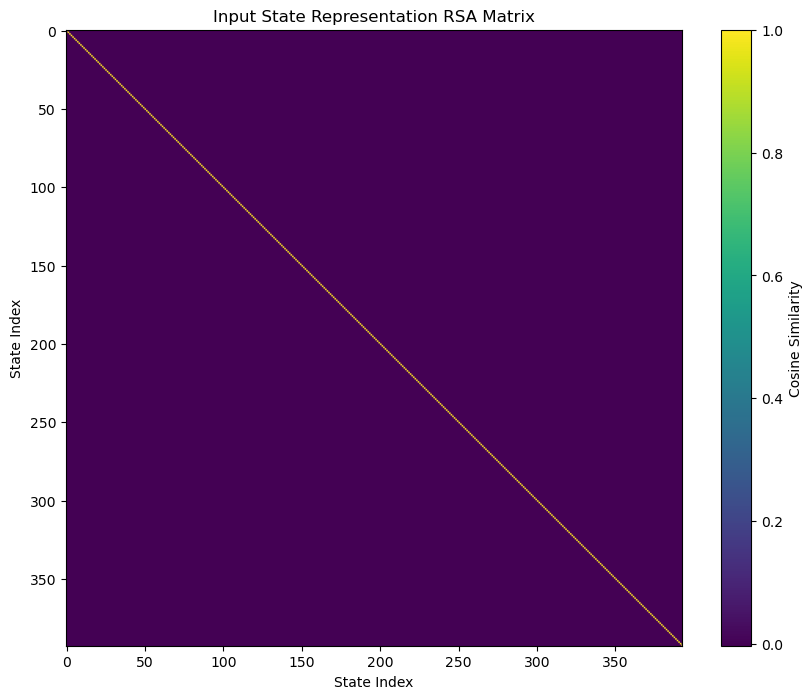

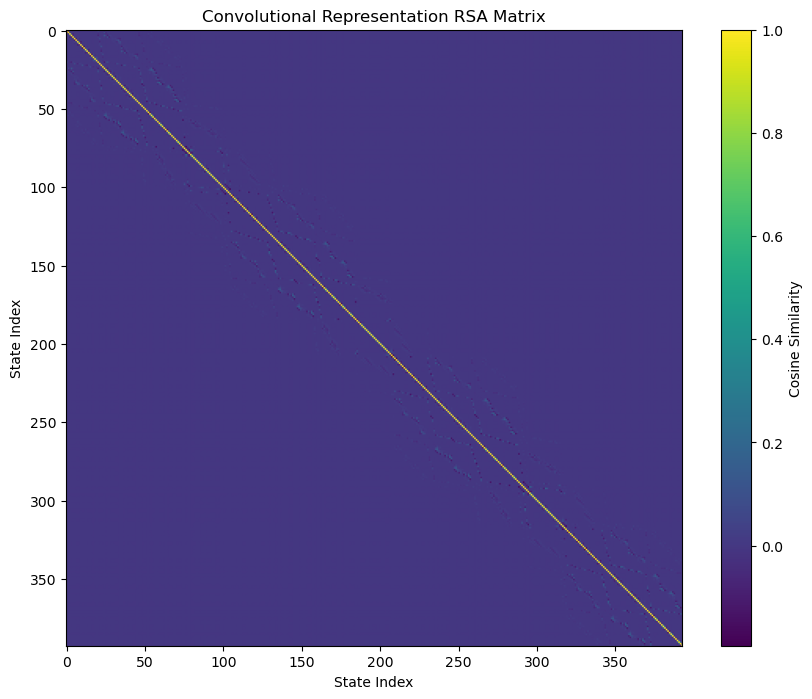

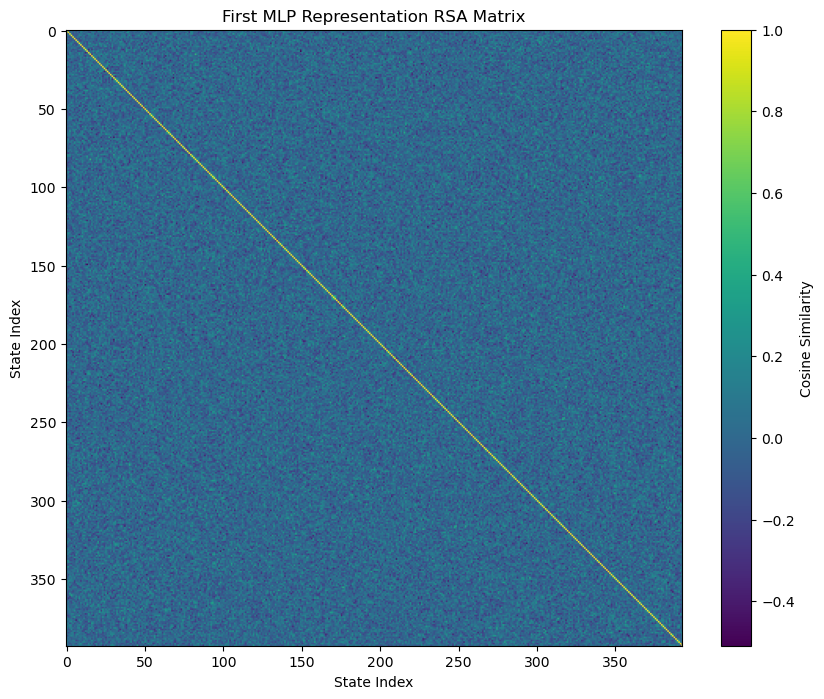

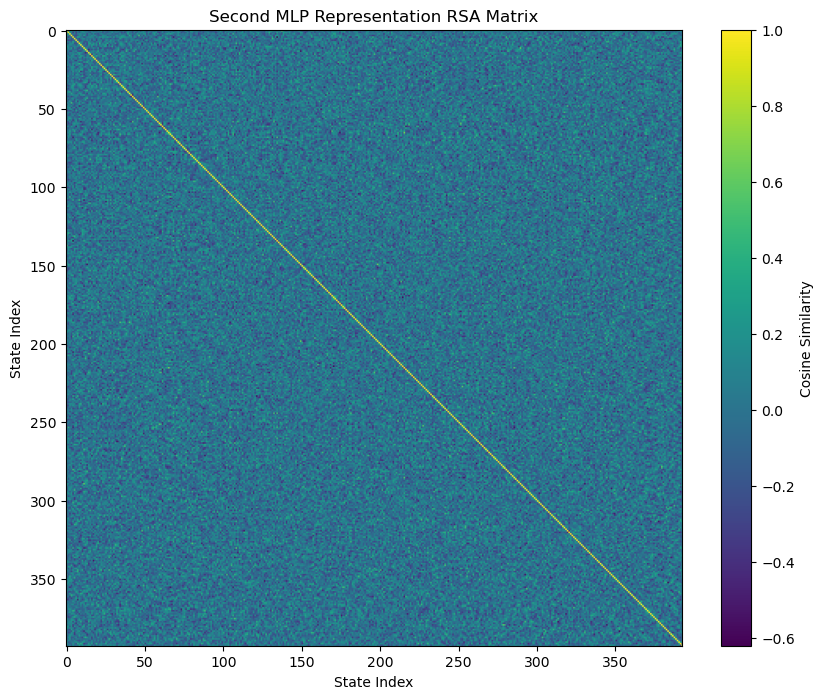

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


In [19]:
dqn_random_init_rsas = accumulate_and_plot(dqn_model_init, dqn_env)

In [20]:
model_dict = torch.load(f"{results_path}/dqn_model_9950.pth")
dqn_model._net.load_state_dict(model_dict["model_state_dict"])
dqn_model._net.eval()

/tmp/ipykernel_2807710/2146058129.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = torch.load(f"{results_path}/dqn_model_9950.pth")


ConvDQNNet(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): LazyLinear(in_features=0, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=4, bias=True)
)

/tmp/ipykernel_2807710/2718200097.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  states = torch.tensor(states, dtype=torch.float32).to('cuda')


Input State Representation Shape: (393, 2025)
Convolutional Representation Shape: (393, 64800)
First MLP Representation Shape: (393, 128) Participation Ratio: 2.7169602139841103
Second MLP Representation Shape: (393, 128) Participation Ratio: 1.3895540924977738
Values Shape: (393,) Min: 0.63271046 Max: 1.0026474 Mean: 0.7486405
Policy Shape: (393,) Min: 1 Max: 3 Mean: 1.748091603053435


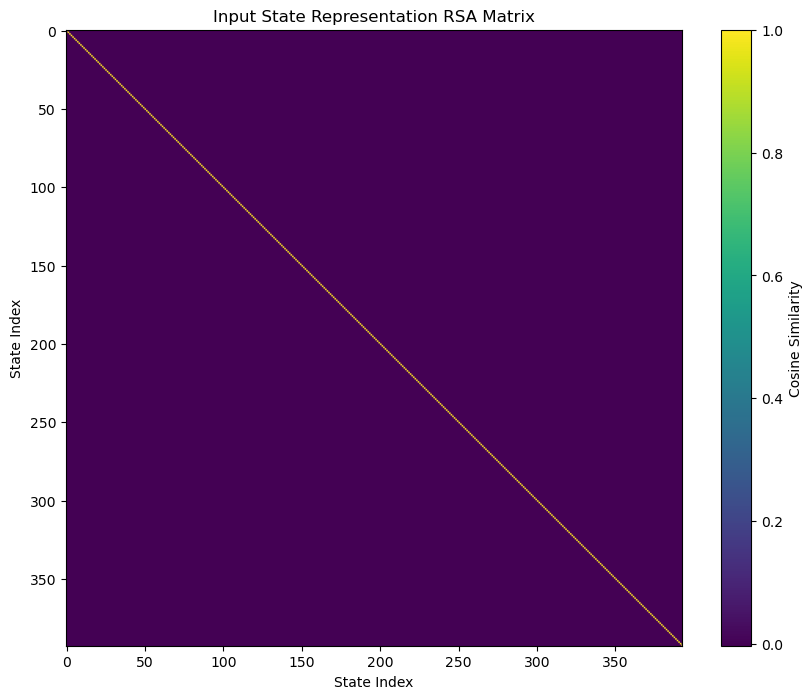

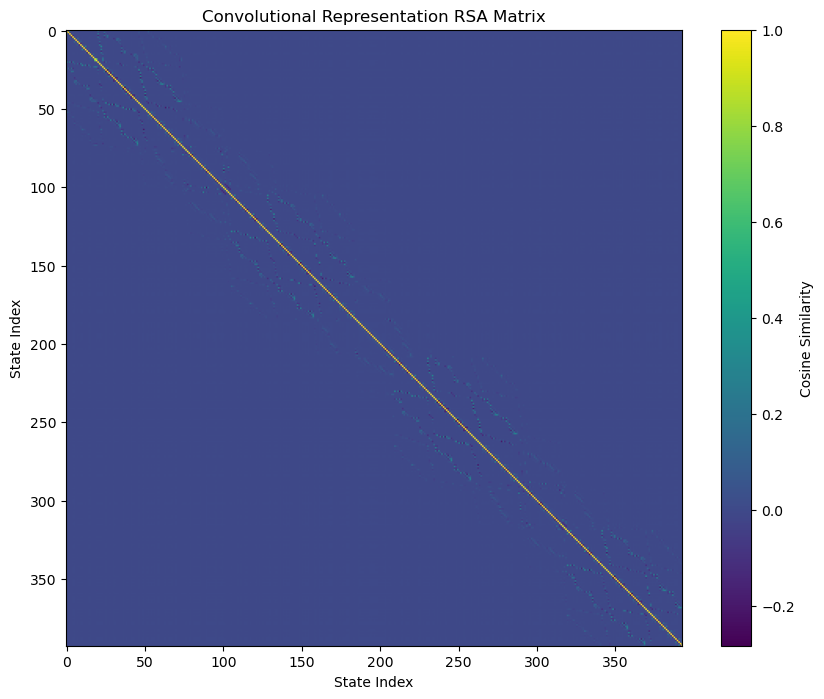

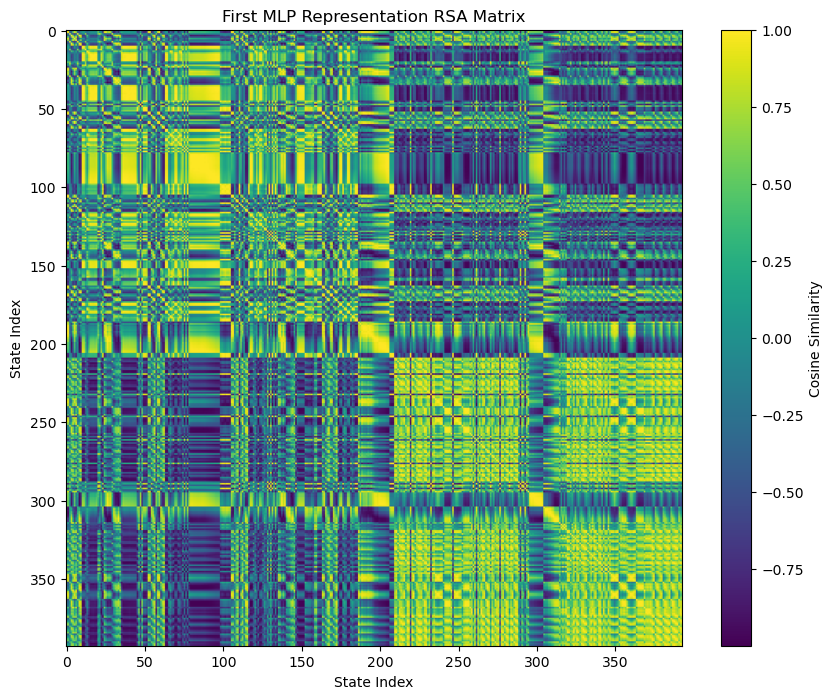

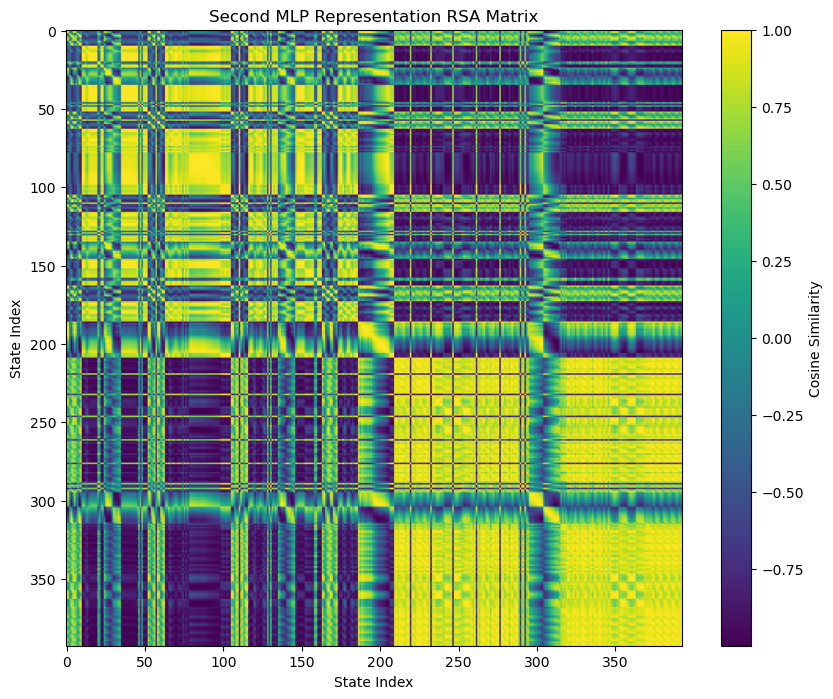

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


In [21]:
dqn_rsas = accumulate_and_plot(dqn_model, dqn_env)

## PPO

In [22]:
# results_path = "../sac/invisible_reward_runs/2025-13-10-20-52"
results_path = "../sac/seb_runs/best_ppo"
args_text = open(f"{results_path}/args.txt", "r").read()
print(args_text)

model: ppo
learning_rate: 0.0003
weight_decay: 0.0
layer_norm: False
discount_factor: 0.99
exploration_rate: 1.0
optimistic_init: 0.0
exploration_decay: 0.995
num_episodes: 1000
num_steps: 4000000
batch_size: 128
target_update_frequency: 50
replay_buffer_size: 1024
burnin: 1000
gae_lambda: 0.95
target_kl: 0.03
update_epochs: 5
value_function_coef: 0.5
entropy_coef: 0.01
clip_coef: 0.2
max_grad_norm: 0.5
convolutional: True
test_frequency: 5
save_model_frequency: 500
visualisation_frequency: 1000
map_name: meister_trimmed.txt
map_yaml_filename: meister_trimmed.yaml
test_map_yaml_filename: test_meister_trimmed.yaml
representation: pixel
episode_timeout: 200
results_dir: results
absolute_results_dir: /mnt/home/slee1/ceph/job_scripts/2025-10-14-12-43-26/job_34



In [23]:
ppo_model = ppo.PPO(
            sample_state=ppo_sample_state,
            num_actions=ppo_num_actions,
            batch_size=64,
            replay_buffer_size=10000,
            learning_rate=3e-4,
            discount_factor=0.99,
            gae_lambda=0.95,
            clip_coef=0.2,
            vf_coef=1.0,
            ent_coef=0.05,
            max_grad_norm=0.5,
            convolutional=True,
            layer_norm=False,
            weight_decay=0.01,
            optimistic_init=True,
        )

ppo_init_model = deepcopy(ppo_model)

In [24]:
# get representations
def get_representations(model, state):
    model._net.eval()
    network = model._net
    with torch.no_grad():
        x = torch.relu(network.conv1(state))
        x = torch.relu(network.conv2(x))
        x_c = x.view(x.size(0), -1)  # Flatten
        x = torch.relu(network.fc1(x_c))
        x = torch.relu(network.fc2(x))
        actor_repr = torch.relu(network.pi_fc(x))
        critic_repr = torch.relu(network.v_fc(x))
        value = network.v(critic_repr)
        actions = network.pi(actor_repr)
        action = torch.argmax(actions, dim=1)
    return x_c, x, actor_repr, critic_repr, value, action

In [25]:
def accumulate_and_plot(model, env):
    conv_reprs = []
    shared_reprs = []
    actor_reprs = []
    critic_reprs = []
    state_reprs = []
    values = []
    policy = []

    i = 0

    for state in env.positional_state_space:
        env.move_agent_to(state)  # Move agent to position
        state_input = env.get_state_representation()
        shape = (1, ) + ppo_state_shape
        state_input = torch.FloatTensor(state_input.reshape(shape)).to('cuda')
        conv, shared, actor, critic, value, actions = get_representations(model, state_input)
        conv_reprs.append(conv.cpu().numpy())
        shared_reprs.append(shared.cpu().numpy())
        actor_reprs.append(actor.cpu().numpy())
        critic_reprs.append(critic.cpu().numpy())
        state_reprs.append(state_input.cpu().numpy())
        values.append(value.cpu().numpy())
        policy.append(actions.cpu().numpy())

    conv_reprs = np.vstack(conv_reprs)  # Shape: (S, convolutional_representation_dim)
    shared_reprs = np.vstack(shared_reprs)  # Shape: (S, representation_dim)
    actor_reprs = np.vstack(actor_reprs)  # Shape: (S, actor_representation_dim)
    critic_reprs = np.vstack(critic_reprs)  # Shape: (S, critic_representation_dim)
    state_reprs = np.vstack(state_reprs).reshape(len(state_reprs), -1)  # Shape: (S, state_representation_dim)
    values = np.vstack(values)  # Shape: (S,)

    print("Input State Representation Shape:", state_reprs.shape)
    print("Convolutional Representation Shape:", conv_reprs.shape, "Participation Ratio:")
    print("Shared Representation Shape:", shared_reprs.shape, "Participation Ratio:", calculate_participation_ratio(shared_reprs))
    print("Actor Representation Shape:", actor_reprs.shape, "Participation Ratio:", calculate_participation_ratio(actor_reprs))
    print("Critic Representation Shape:", critic_reprs.shape, "Participation Ratio:", calculate_participation_ratio(critic_reprs))
    print("Values Shape:", values.shape, "Min:", np.min(values), "Max:", np.max(values), "Mean:", np.mean(values))

    state_to_values = {state: values[i].squeeze() for i, state in enumerate(env.positional_state_space)}
    state_to_policy = {state: policy[i].squeeze() for i, state in enumerate(env.positional_state_space)}

    state_rsa = plot_rsa_matrix(state_reprs, "Input State Representation RSA Matrix")
    conv_rsa = plot_rsa_matrix(conv_reprs, "Convolutional Representation RSA Matrix")
    shared_rsa = plot_rsa_matrix(shared_reprs, "Shared Representation RSA Matrix")
    actor_rsa = plot_rsa_matrix(actor_reprs, "Actor Representation RSA Matrix")
    critic_rsa = plot_rsa_matrix(critic_reprs, "Critic Representation RSA Matrix")
    env.plot_heatmap_over_env(state_to_values, save_name='ppo_values.pdf')
    env.plot_heatmap_over_env(state_to_values, save_name='ppo_values.png')

    cmap = plt.get_cmap('viridis')
    env.plot_heatmap_over_env(state_to_policy, save_name='ppo_policy.pdf', colormap=cmap)
    env.plot_heatmap_over_env(state_to_policy, save_name='ppo_policy.png', colormap=cmap)

    # mean_off_diag_state = get_mean_off_diagonal(state_rsa)
    # mean_off_diag_conv = get_mean_off_diagonal(conv_rsa)
    # mean_off_diag_shared_1 = get_mean_off_diagonal(shared_rsa)
    # mean_off_diag_actor = get_mean_off_diagonal(actor_rsa)
    # mean_off_diag_critic = get_mean_off_diagonal(critic_rsa)

    # # get within-label similarities
    # within_label_sim_state = get_within_label_similarity(state_reprs, state_to_label, state_id_mapping)
    # within_label_sim_conv = get_within_label_similarity(conv_reprs, state_to_label, state_id_mapping)
    # within_label_sim_shared = get_within_label_similarity(shared_reprs, state_to_label, state_id_mapping)
    # within_label_sim_actor = get_within_label_similarity(actor_reprs, state_to_label, state_id_mapping)
    # within_label_sim_critic = get_within_label_similarity(critic_reprs, state_to_label, state_id_mapping)

    return {'state': state_rsa,
            'conv': conv_rsa,
            'shared': shared_rsa,
            'actor': actor_rsa,
            'critic': critic_rsa}

    # return {'state': (mean_off_diag_state, within_label_sim_state),
    #         'conv': (mean_off_diag_conv, within_label_sim_conv),
    #         'shared': (mean_off_diag_shared_1, within_label_sim_shared),
    #         'actor': (mean_off_diag_actor, within_label_sim_actor),
    #         'critic': (mean_off_diag_critic, within_label_sim_critic)}

Input State Representation Shape: (390, 1369)
Convolutional Representation Shape: (390, 43808) Participation Ratio:
Shared Representation Shape: (390, 128) Participation Ratio: 31.77967798474449
Actor Representation Shape: (390, 128) Participation Ratio: 20.897823725443903
Critic Representation Shape: (390, 128) Participation Ratio: 21.408852172610334
Values Shape: (390, 1) Min: 0.9676801 Max: 0.9680588 Mean: 0.9678757


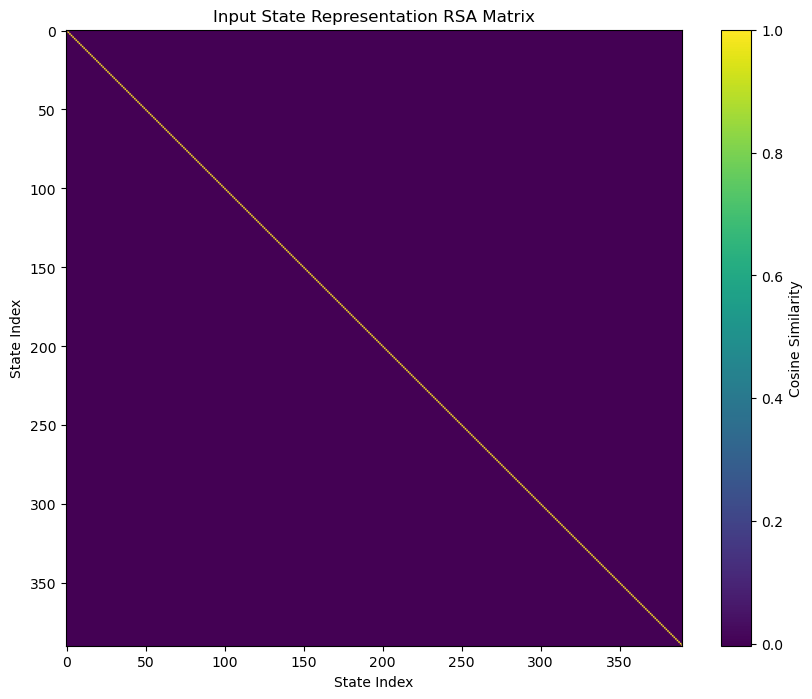

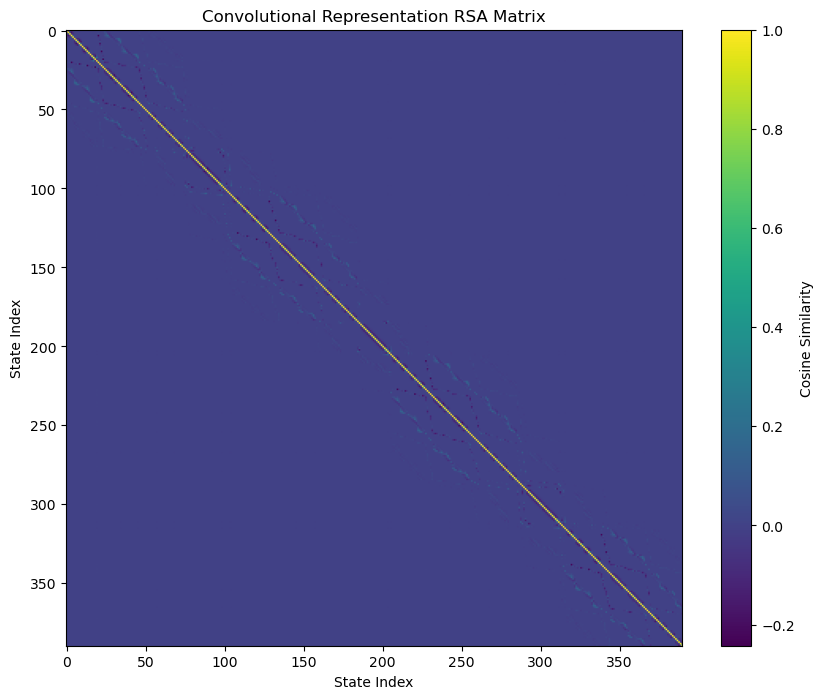

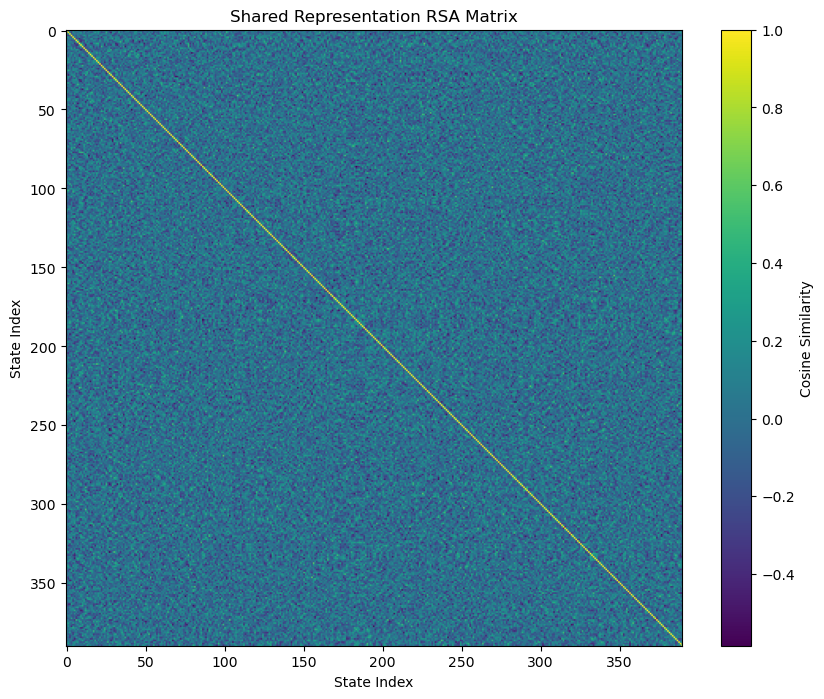

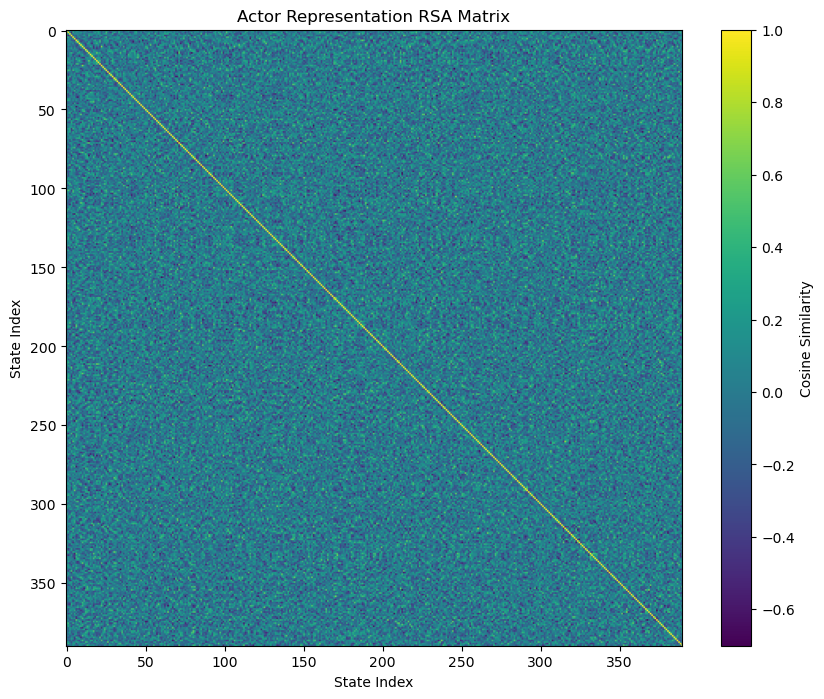

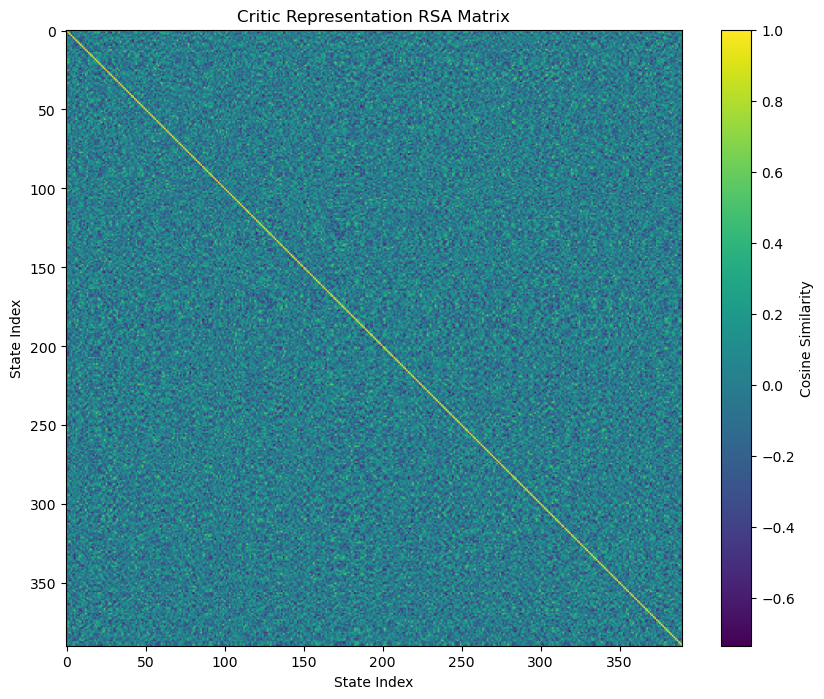

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


In [26]:
ppo_init_rsas = accumulate_and_plot(ppo_init_model, ppo_env)

In [27]:
model_dict = torch.load(f"{results_path}/ppo_model_4000000.pth")

/tmp/ipykernel_2807710/942002417.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = torch.load(f"{results_path}/ppo_model_4000000.pth")


In [28]:
# Check for any warnings
print("\nTrying to load...")
missing, unexpected = ppo_model._net.load_state_dict(model_dict["model_state_dict"], strict=False)
print(f"Missing keys: {missing}")
print(f"Unexpected keys: {unexpected}")


Trying to load...
Missing keys: []
Unexpected keys: []


In [29]:
model_dict = torch.load(f"{results_path}/ppo_model_4000000.pth")
ppo_model._net.load_state_dict(model_dict["model_state_dict"], strict=True)
ppo_model._net.eval()

/tmp/ipykernel_2807710/2901405386.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_dict = torch.load(f"{results_path}/ppo_model_4000000.pth")


ConvActorCritic(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): LazyLinear(in_features=0, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=128, bias=True)
  (pi_fc): Linear(in_features=128, out_features=128, bias=True)
  (pi): Linear(in_features=128, out_features=4, bias=True)
  (v_fc): Linear(in_features=128, out_features=128, bias=True)
  (v): Linear(in_features=128, out_features=1, bias=True)
  (ln_conv1): Identity()
  (ln_conv2): Identity()
  (ln_fc1): Identity()
  (ln_fc2): Identity()
)

Input State Representation Shape: (390, 1369)
Convolutional Representation Shape: (390, 43808) Participation Ratio:
Shared Representation Shape: (390, 128) Participation Ratio: 2.386553556909105
Actor Representation Shape: (390, 128) Participation Ratio: 2.0349269875234084
Critic Representation Shape: (390, 128) Participation Ratio: 2.206590085129441
Values Shape: (390, 1) Min: 0.43012726 Max: 0.98328483 Mean: 0.61825633


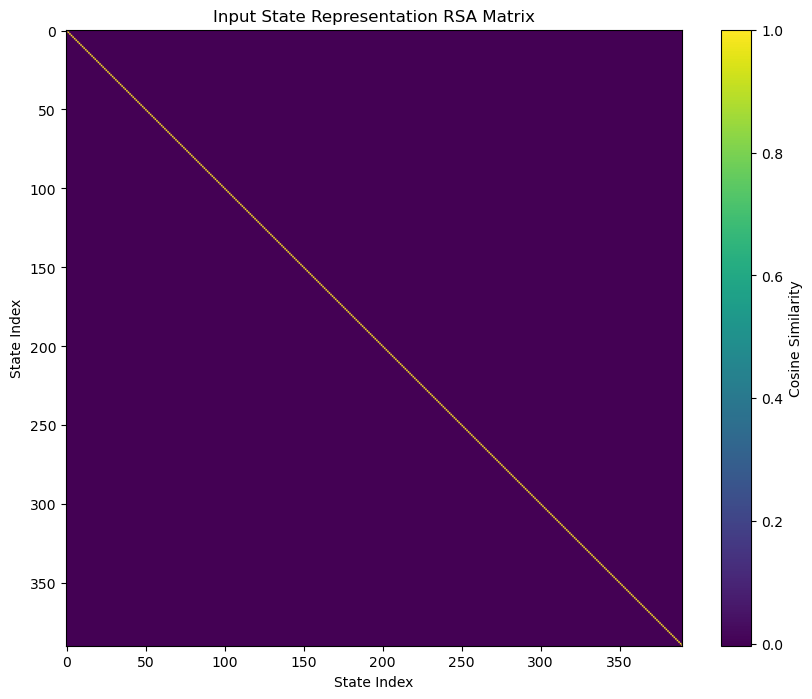

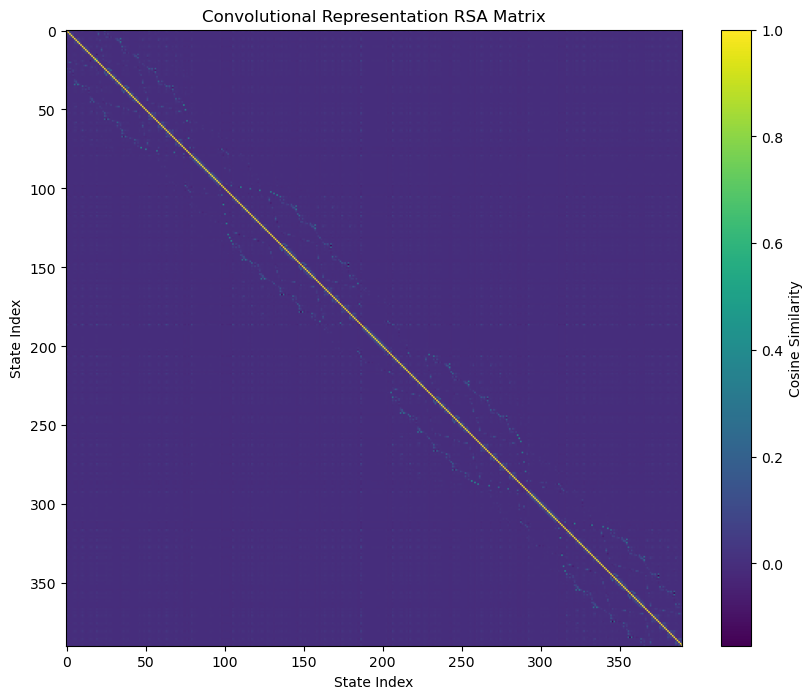

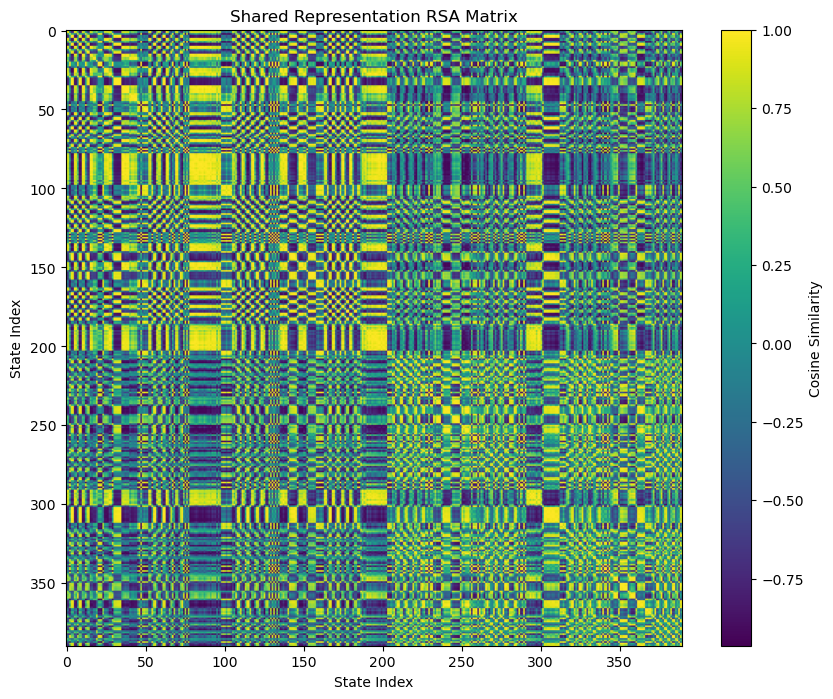

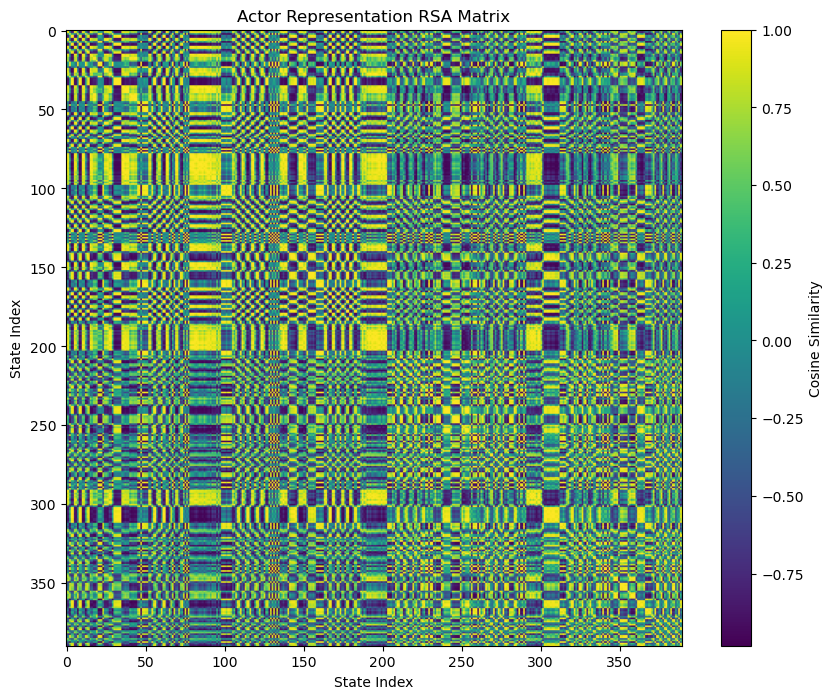

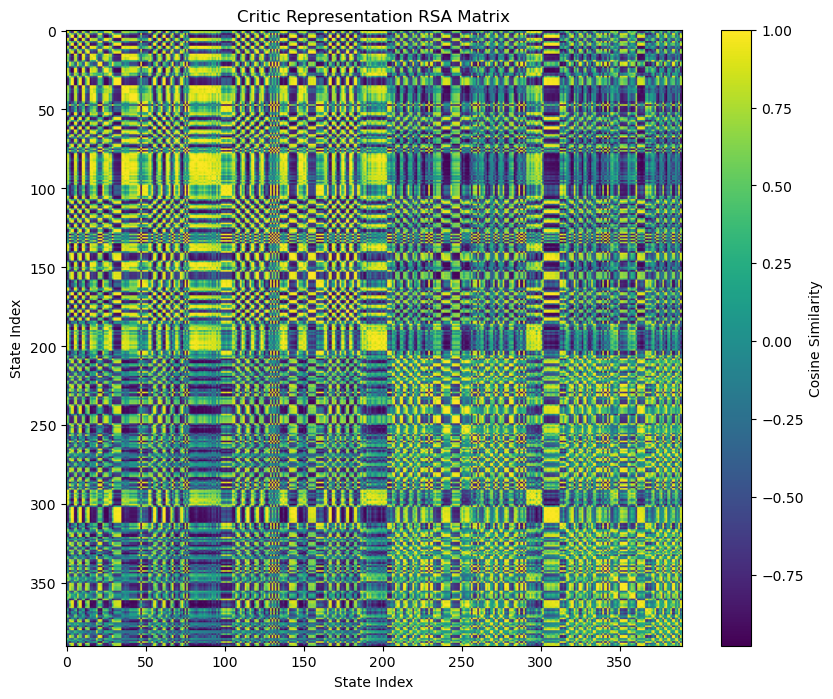

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')
/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


In [30]:
ppo_rsas = accumulate_and_plot(ppo_model, ppo_env)

## Optimal policy algo

In [31]:
from sac.utils import dijkstra_policy

# 1) build P as you already do
# P: (S,A,S), deterministic 0/1

# 2) goals = cells that contain rewards
dqn_goal_mask = np.zeros(S_dqn, dtype=bool)
for xy in dqn_reward_positions:                 # reward_positions are (y,x) or (x,y); you used [:2] above
    dqn_goal_mask[dqn_state_id_mapping[xy]] = True
ppo_goal_mask = np.zeros(S_ppo, dtype=bool)
for xy in ppo_reward_positions:                 # reward_positions are (y,x) or (x,y); you used [:2] above
    ppo_goal_mask[ppo_state_id_mapping[xy]] = True

# 3) build nonnegative costs C
# simplest: unit step cost (minimize number of steps to any goal)
C_dqn = np.full((S_dqn, A_dqn), 1.0, dtype=float)
C_ppo = np.full((S_ppo, A_ppo), 1.0, dtype=float)

# optional niceties:
# - if some (s,a) is impossible, set it to +inf (will be ignored by dijkstra)
invalid = (P_dqn.sum(axis=2) == 0.0)            # no defined next state
C_dqn[invalid] = np.inf
invalid = (P_ppo.sum(axis=2) == 0.0)            # no defined next state
C_ppo[invalid] = np.inf

# - if you want different step costs (e.g., pushing doors costs 5):
#   detect those (s,a) and set C[s,a] accordingly.

# 4) run dijkstra to get all-states optimal policy
J_dqn, pi_dqn = dijkstra_policy(P_dqn, C_dqn, dqn_goal_mask)
J_ppo, pi_ppo = dijkstra_policy(P_ppo, C_ppo, ppo_goal_mask)

# pi[s] = optimal action id from state s (or -1 if s is a goal or unreachable)
# J[s]  = minimal total cost-to-go to any goal (inf if unreachable)

In [32]:
dqn_state_to_policy = {dqn_id_state_mapping[i]: pi_dqn[i] for i in range(len(dqn_id_state_mapping)) if pi_dqn[i] >= 0}
dqn_state_to_cost = {dqn_id_state_mapping[i]: J_dqn[i] for i in range(len(dqn_id_state_mapping)) if J_dqn[i] < np.inf}

ppo_state_to_policy = {ppo_id_state_mapping[i]: pi_ppo[i] for i in range(len(ppo_id_state_mapping)) if pi_ppo[i] >= 0}
ppo_state_to_cost = {ppo_id_state_mapping[i]: J_ppo[i] for i in range(len(ppo_id_state_mapping)) if J_ppo[i] < np.inf}

In [33]:
cmap = plt.get_cmap('viridis')

In [34]:
dqn_env.plot_heatmap_over_env(dqn_state_to_policy, save_name='optimal_policy.pdf', colormap=cmap)
dqn_env.plot_heatmap_over_env(dqn_state_to_policy, save_name='optimal_policy.png', colormap=cmap)

# env.plot_heatmap_over_env(state_to_cost, save_name='optimal_cost.pdf')
# env.plot_heatmap_over_env(state_to_cost, save_name='optimal_cost.png')

/mnt/home/msrinath/workspace/state-abstraction-capacity/src/key-door-seblee97/key_door/visualisation_env.py:160: UserWarning: Adding colorbar to a different Figure <Figure size 200x200 with 1 Axes> than <Figure size 200x20 with 1 Axes> which fig.colorbar is called on.
  cbar = fig.colorbar(im, cax=ax, orientation='horizontal')


# Reference similarity plots

In [35]:
len(dqn_state_to_policy), len(dqn_state_to_label)

(392, 393)

In [36]:
len(ppo_state_to_policy), len(ppo_state_to_label)

(389, 390)

In [37]:
dqn_rsa_policy = np.zeros((len(dqn_state_to_label), len(dqn_state_to_label)))
dqn_rsa_mdp = np.zeros_like(dqn_rsa_policy)

ppo_rsa_policy = np.zeros((len(ppo_state_to_label), len(ppo_state_to_label)))
ppo_rsa_mdp = np.zeros_like(ppo_rsa_policy) 

In [38]:
for i in range(len(dqn_rsa_policy)):
    for j in range(len(dqn_rsa_policy)):
        if pi_dqn[i] == pi_dqn[j]:
            dqn_rsa_policy[i, j] = 1
        if dqn_state_label[i] == dqn_state_label[j]:
            dqn_rsa_mdp[i, j] = 1

for i in range(len(ppo_rsa_policy)):
    for j in range(len(ppo_rsa_policy)):
        if pi_dqn[i] == pi_dqn[j]:
            ppo_rsa_policy[i, j] = 1
        if dqn_state_label[i] == dqn_state_label[j]:
            ppo_rsa_mdp[i, j] = 1

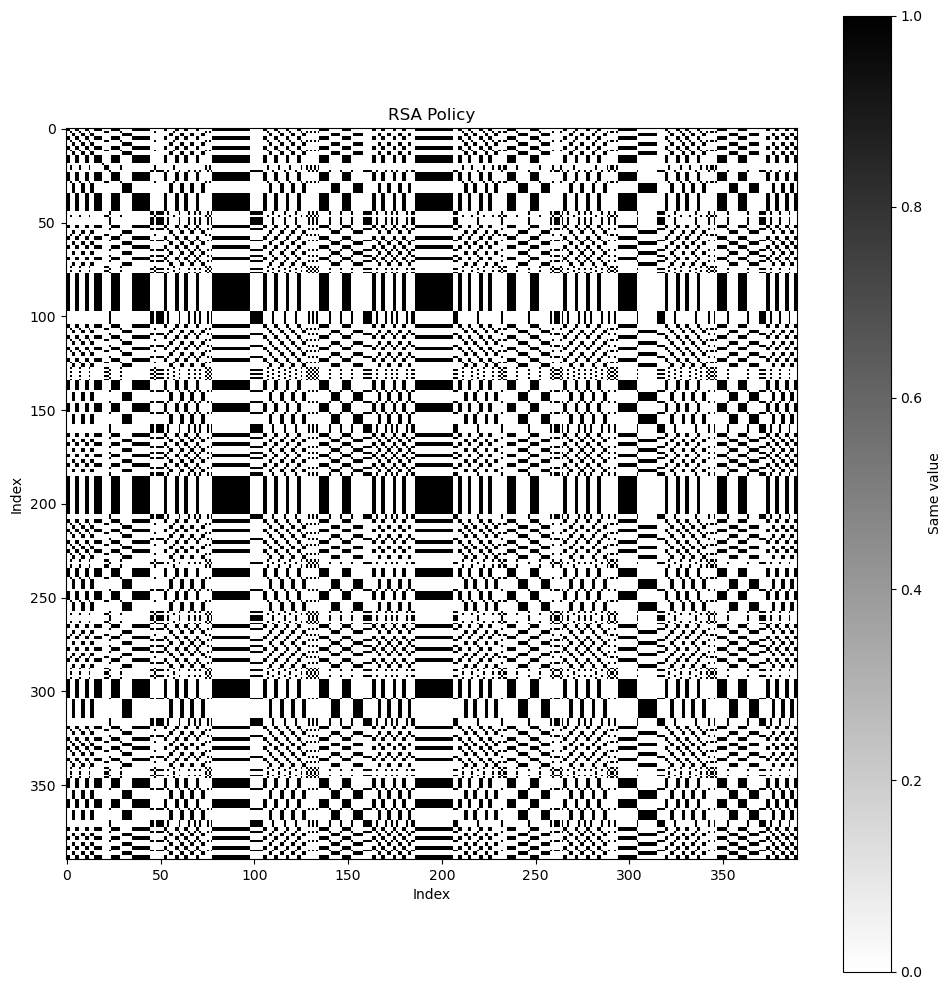

In [39]:
plt.figure(figsize=(10, 10))
plt.imshow(ppo_rsa_policy, cmap='binary', interpolation='nearest')
plt.colorbar(label='Same value')
plt.xlabel('Index')
plt.ylabel('Index')
plt.title('RSA Policy')
plt.tight_layout()
plt.show()

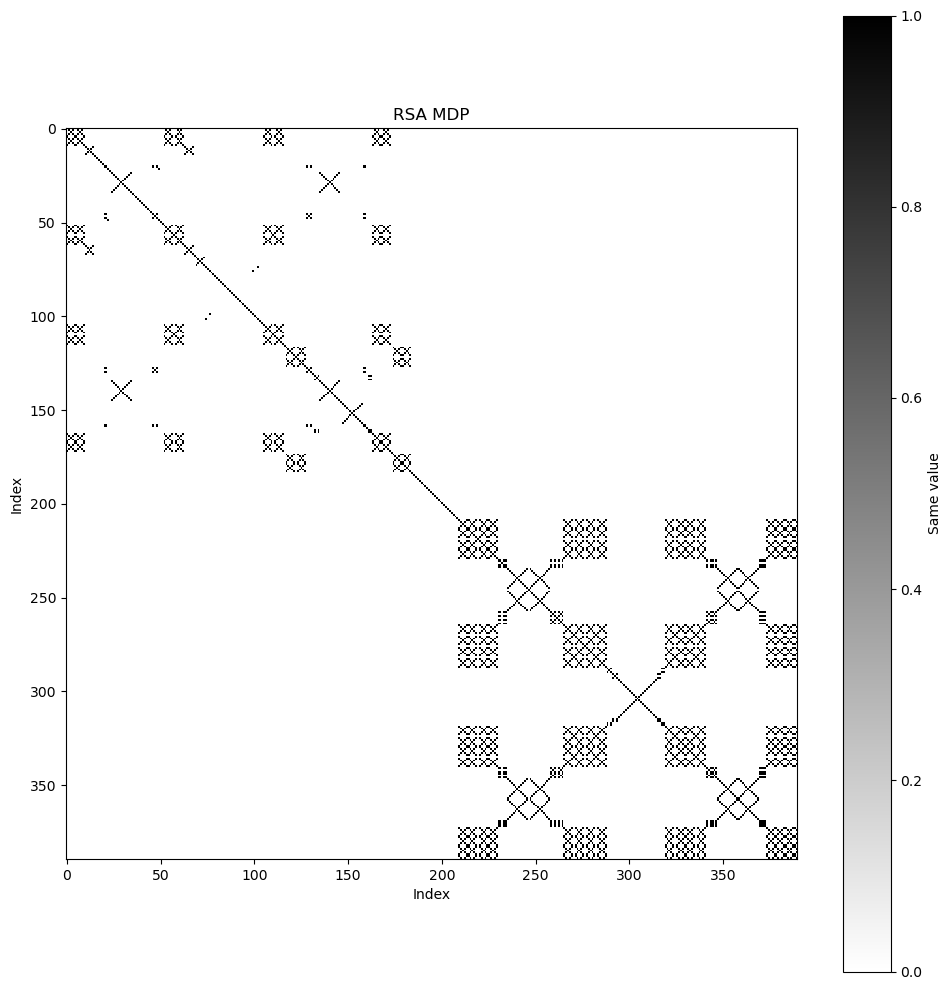

In [40]:
plt.figure(figsize=(10, 10))
plt.imshow(ppo_rsa_mdp, cmap='binary', interpolation='nearest')
plt.colorbar(label='Same value')
plt.xlabel('Index')
plt.ylabel('Index')
plt.title('RSA MDP')
plt.tight_layout()
plt.show()

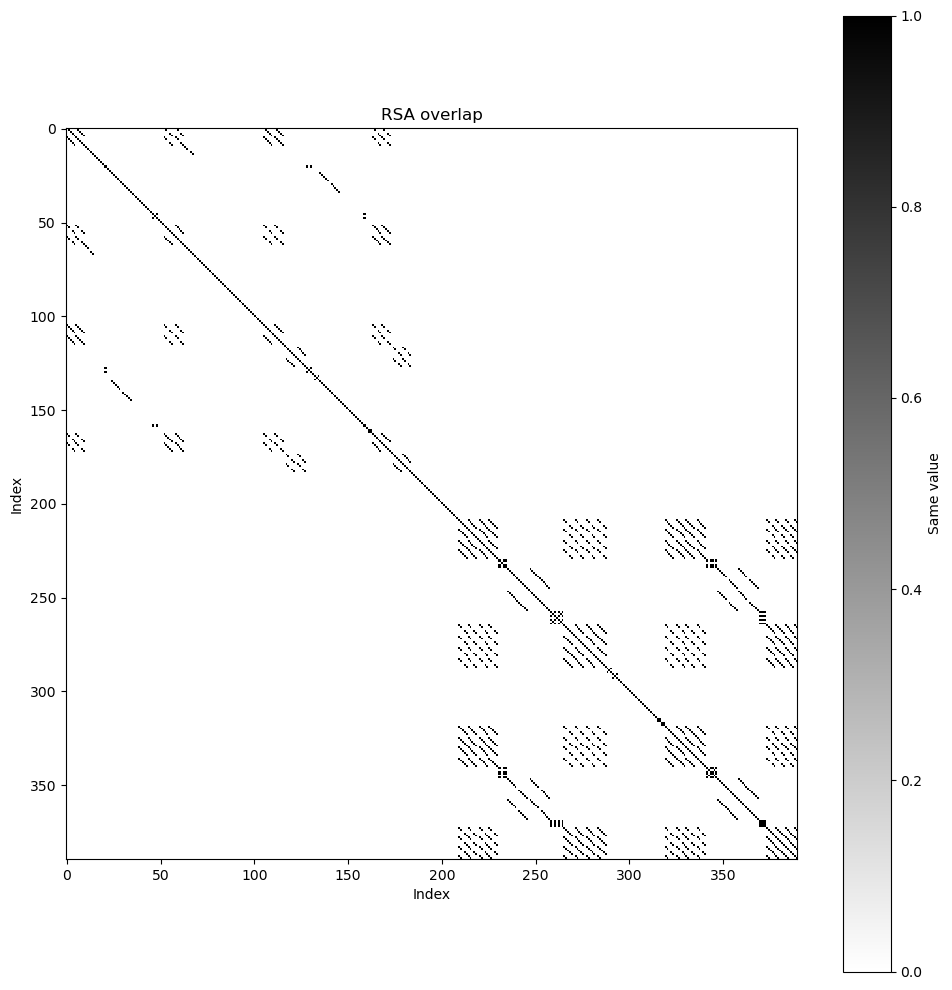

In [41]:
# calculate overlap between the two binary rsas
ppo_product_rsa = ppo_rsa_mdp * ppo_rsa_policy
dqn_product_rsa = dqn_rsa_mdp * dqn_rsa_policy

plt.figure(figsize=(10, 10))
plt.imshow(ppo_product_rsa, cmap='binary', interpolation='nearest')
plt.colorbar(label='Same value')
plt.xlabel('Index')
plt.ylabel('Index')
plt.title('RSA overlap')
plt.tight_layout()
plt.show()

In [42]:
len(dqn_product_rsa)

393

In [43]:
ppo_product_rsa.sum() / (len(ppo_product_rsa)**2) * 100

np.float64(1.3122945430637738)

## Similarity plots

In [51]:
def get_local_global_sims(rsa, state_to_label, state_id_mapping, mask=None):
    # if mask is not None:
    #     rsa = rsa * mask
    mean_off_diag = get_mean_off_diagonal(rsa)
    within_label_sim = get_within_label_similarity(rsa, state_to_label, state_id_mapping)
    return mean_off_diag, within_label_sim

In [52]:
dqn_mask = 1 - dqn_product_rsa
ppo_mask = 1 - ppo_product_rsa

In [53]:
dqn_hom_sims = {layer: get_local_global_sims(dqn_rsas[layer], dqn_state_to_label, dqn_state_id_mapping, dqn_mask) for layer in dqn_rsas}
dqn_init_hom_sims = {layer: get_local_global_sims(dqn_random_init_rsas[layer], dqn_state_to_label, dqn_state_id_mapping, dqn_mask) for layer in dqn_random_init_rsas}
ppo_hom_sims = {layer: get_local_global_sims(ppo_rsas[layer], ppo_state_to_label, ppo_state_id_mapping, ppo_mask) for layer in ppo_rsas}
ppo_init_hom_sims = {layer: get_local_global_sims(ppo_init_rsas[layer], ppo_state_to_label, ppo_state_id_mapping, ppo_mask) for layer in ppo_init_rsas}

dqn_policy_sims = {layer: get_local_global_sims(dqn_rsas[layer], dqn_state_to_policy, dqn_state_id_mapping, dqn_mask) for layer in dqn_rsas}
dqn_init_policy_sims = {layer: get_local_global_sims(dqn_random_init_rsas[layer], dqn_state_to_policy, dqn_state_id_mapping, dqn_mask) for layer in dqn_random_init_rsas}
ppo_policy_sims = {layer: get_local_global_sims(ppo_rsas[layer], ppo_state_to_policy, ppo_state_id_mapping, ppo_mask) for layer in ppo_rsas}
ppo_init_policy_sims = {layer: get_local_global_sims(ppo_init_rsas[layer], ppo_state_to_policy, ppo_state_id_mapping, ppo_mask) for layer in ppo_init_rsas}

In [54]:
color_1 = '#009988'
color_2 = '#EE7733'

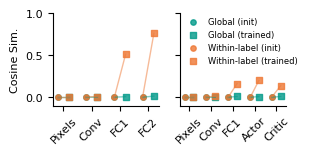

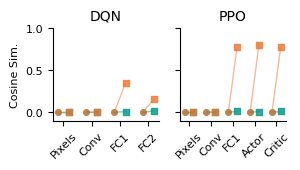

In [55]:
# Prepare data for DQN and PPO
import matplotlib.pyplot as plt
dqn_labels = ['Pixels', 'Conv', 'FC1', 'FC2']
ppo_labels = ['Pixels', 'Conv', 'FC1', 'Actor', 'Critic']

dqn_global_hom = [abs(x) for x in [dqn_hom_sims['state'][0], dqn_hom_sims['conv'][0], dqn_hom_sims['shared_1'][0], dqn_hom_sims['shared_2'][0]]]
dqn_local_hom = [abs(x) for x in [dqn_hom_sims['state'][1], dqn_hom_sims['conv'][1], dqn_hom_sims['shared_1'][1], dqn_hom_sims['shared_2'][1]]]
dqn_inits_global_hom = [abs(x) for x in [dqn_init_hom_sims['state'][0], dqn_init_hom_sims['conv'][0], dqn_init_hom_sims['shared_1'][0], dqn_init_hom_sims['shared_2'][0]]]
dqn_inits_local_hom = [abs(x) for x in [dqn_init_hom_sims['state'][1], dqn_init_hom_sims['conv'][1], dqn_init_hom_sims['shared_1'][1], dqn_init_hom_sims['shared_2'][1]]]

dqn_global_policy = [abs(x) for x in [dqn_policy_sims['state'][0], dqn_policy_sims['conv'][0], dqn_policy_sims['shared_1'][0], dqn_policy_sims['shared_2'][0]]]
dqn_local_policy = [abs(x) for x in [dqn_policy_sims['state'][1], dqn_policy_sims['conv'][1], dqn_policy_sims['shared_1'][1], dqn_policy_sims['shared_2'][1]]]
dqn_inits_global_policy = [abs(x) for x in [dqn_init_policy_sims['state'][0], dqn_init_policy_sims['conv'][0], dqn_init_policy_sims['shared_1'][0], dqn_init_policy_sims['shared_2'][0]]]
dqn_inits_local_policy = [abs(x) for x in [dqn_init_policy_sims['state'][1], dqn_init_policy_sims['conv'][1], dqn_init_policy_sims['shared_1'][1], dqn_init_policy_sims['shared_2'][1]]]

ppo_global_hom = [abs(x) for x in [ppo_hom_sims['state'][0], ppo_hom_sims['conv'][0], ppo_hom_sims['shared'][0], ppo_hom_sims['actor'][0], ppo_hom_sims['critic'][0]]]
ppo_local_hom = [abs(x) for x in [ppo_hom_sims['state'][1], ppo_hom_sims['conv'][1], ppo_hom_sims['shared'][1], ppo_hom_sims['actor'][1], ppo_hom_sims['critic'][1]]]
ppo_inits_global_hom = [abs(x) for x in [ppo_init_hom_sims['state'][0], ppo_init_hom_sims['conv'][0], ppo_init_hom_sims['shared'][0], ppo_init_hom_sims['actor'][0], ppo_init_hom_sims['critic'][0]]]
ppo_inits_local_hom = [abs(x) for x in [ppo_init_hom_sims['state'][1], ppo_init_hom_sims['conv'][1], ppo_init_hom_sims['shared'][1], ppo_init_hom_sims['actor'][1], ppo_init_hom_sims['critic'][1]]]

ppo_global_policy = [abs(x) for x in [ppo_policy_sims['state'][0], ppo_policy_sims['conv'][0], ppo_policy_sims['shared'][0], ppo_policy_sims['actor'][0], ppo_policy_sims['critic'][0]]]
ppo_local_policy = [abs(x) for x in [ppo_policy_sims['state'][1], ppo_policy_sims['conv'][1], ppo_policy_sims['shared'][1], ppo_policy_sims['actor'][1], ppo_policy_sims['critic'][1]]]
ppo_inits_global_policy = [abs(x) for x in [ppo_init_policy_sims['state'][0], ppo_init_policy_sims['conv'][0], ppo_init_policy_sims['shared'][0], ppo_init_policy_sims['actor'][0], ppo_init_policy_sims['critic'][0]]]
ppo_inits_local_policy = [abs(x) for x in [ppo_init_policy_sims['state'][1], ppo_init_policy_sims['conv'][1], ppo_init_policy_sims['shared'][1], ppo_init_policy_sims['actor'][1], ppo_init_policy_sims['critic'][1]]]

offset = 0.2  # offset between global and local points

# Figure 1: MDP Abstractions (DQN left, PPO right)
fig1, axs1 = plt.subplots(1, 2, figsize=(3.0, 1.2), sharey=True)

# DQN MDP abstraction
x_dqn = np.arange(len(dqn_labels))
axs1[0].scatter(x_dqn - offset, dqn_inits_global_hom, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs1[0].scatter(x_dqn + offset, dqn_global_hom, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)
axs1[0].scatter(x_dqn - offset, dqn_inits_local_hom, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs1[0].scatter(x_dqn + offset, dqn_local_hom, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)
for i in range(len(dqn_labels)):
    axs1[0].plot([x_dqn[i] - offset, x_dqn[i] + offset], [dqn_inits_global_hom[i], dqn_global_hom[i]], color_1, alpha=0.5, linewidth=1)
    axs1[0].plot([x_dqn[i] - offset, x_dqn[i] + offset], [dqn_inits_local_hom[i], dqn_local_hom[i]], color_2, alpha=0.5, linewidth=1)

# PPO MDP abstraction
x_ppo = np.arange(len(ppo_labels))
axs1[1].scatter(x_ppo - offset, ppo_inits_global_hom, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs1[1].scatter(x_ppo + offset, ppo_global_hom, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)
axs1[1].scatter(x_ppo - offset, ppo_inits_local_hom, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs1[1].scatter(x_ppo + offset, ppo_local_hom, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)
for i in range(len(ppo_labels)):
    axs1[1].plot([x_ppo[i] - offset, x_ppo[i] + offset], [ppo_inits_global_hom[i], ppo_global_hom[i]], color_1, alpha=0.5, linewidth=1)
    axs1[1].plot([x_ppo[i] - offset, x_ppo[i] + offset], [ppo_inits_local_hom[i], ppo_local_hom[i]], color_2, alpha=0.5, linewidth=1)

# Format Figure 1
axs1[0].set_ylabel('Cosine Sim.', fontsize=8)
# axs1[0].set_title('DQN', fontsize=10)
# axs1[1].set_title('PPO', fontsize=10)
axs1[0].set_xticks(x_dqn)
axs1[0].set_xticklabels(dqn_labels, fontsize=8, rotation=45)
axs1[1].set_xticks(x_ppo)
axs1[1].set_xticklabels(ppo_labels, fontsize=8, rotation=45)
axs1[0].tick_params(axis='y', labelsize=8)
axs1[1].tick_params(axis='y', labelsize=8)
axs1[0].set_ylim(-0.1, 1.0)
axs1[1].legend(frameon=False, fontsize=6, loc=(0.01, 0.4))

sns.despine()
plt.show()
fig1.savefig('mdp_abstractions.pdf', transparent=True, bbox_inches='tight')

# Figure 2: Policy Abstractions (DQN left, PPO right)
fig2, axs2 = plt.subplots(1, 2, figsize=(3.0, 1.2), sharey=True)

# DQN Policy abstraction
axs2[0].scatter(x_dqn - offset, dqn_inits_global_policy, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs2[0].scatter(x_dqn + offset, dqn_global_policy, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)
axs2[0].scatter(x_dqn - offset, dqn_inits_local_policy, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs2[0].scatter(x_dqn + offset, dqn_local_policy, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)
for i in range(len(dqn_labels)):
    axs2[0].plot([x_dqn[i] - offset, x_dqn[i] + offset], [dqn_inits_global_policy[i], dqn_global_policy[i]], color_1, alpha=0.5, linewidth=1)
    axs2[0].plot([x_dqn[i] - offset, x_dqn[i] + offset], [dqn_inits_local_policy[i], dqn_local_policy[i]], color_2, alpha=0.5, linewidth=1)

# PPO Policy abstraction
axs2[1].scatter(x_ppo - offset, ppo_inits_global_policy, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs2[1].scatter(x_ppo + offset, ppo_global_policy, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)
axs2[1].scatter(x_ppo - offset, ppo_inits_local_policy, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs2[1].scatter(x_ppo + offset, ppo_local_policy, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)
for i in range(len(ppo_labels)):
    axs2[1].plot([x_ppo[i] - offset, x_ppo[i] + offset], [ppo_inits_global_policy[i], ppo_global_policy[i]], color_1, alpha=0.5, linewidth=1)
    axs2[1].plot([x_ppo[i] - offset, x_ppo[i] + offset], [ppo_inits_local_policy[i], ppo_local_policy[i]], color_2, alpha=0.5, linewidth=1)

# Format Figure 2
axs2[0].set_ylabel('Cosine Sim.', fontsize=8)
axs2[0].set_title('DQN', fontsize=10)
axs2[1].set_title('PPO', fontsize=10)
axs2[0].set_xticks(x_dqn)
axs2[0].set_xticklabels(dqn_labels, fontsize=8, rotation=45)
axs2[1].set_xticks(x_ppo)
axs2[1].set_xticklabels(ppo_labels, fontsize=8, rotation=45)
axs2[0].tick_params(axis='y', labelsize=8)
axs2[1].tick_params(axis='y', labelsize=8)
axs2[0].set_ylim(-0.1, 1.0)
# axs2[0].legend(frameon=False, fontsize=6, loc=(0.1, 0.3))

sns.despine()
plt.show()
fig2.savefig('policy_abstractions.pdf', transparent=True, bbox_inches='tight')

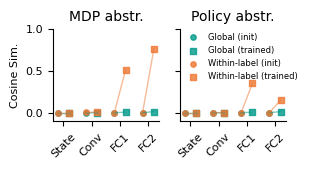

In [56]:
# make scatter plot for dqn_sims and dqn_init_sims
import matplotlib.pyplot as plt
labels = ['State', 'Conv', 'FC1', 'FC2']
dqn_global_hom = [abs(x) for x in [dqn_hom_sims['state'][0], dqn_hom_sims['conv'][0], dqn_hom_sims['shared_1'][0], dqn_hom_sims['shared_2'][0]]]
dqn_local_hom = [abs(x) for x in [dqn_hom_sims['state'][1], dqn_hom_sims['conv'][1], dqn_hom_sims['shared_1'][1], dqn_hom_sims['shared_2'][1]]]
dqn_inits_global_hom = [abs(x) for x in [dqn_init_hom_sims['state'][0], dqn_init_hom_sims['conv'][0], dqn_init_hom_sims['shared_1'][0], dqn_init_hom_sims['shared_2'][0]]]
dqn_inits_local_hom = [abs(x) for x in [dqn_init_hom_sims['state'][1], dqn_init_hom_sims['conv'][1], dqn_init_hom_sims['shared_1'][1], dqn_init_hom_sims['shared_2'][1]]]

dqn_global_policy = [abs(x) for x in [dqn_policy_sims['state'][0], dqn_policy_sims['conv'][0], dqn_policy_sims['shared_1'][0], dqn_policy_sims['shared_2'][0]]]
dqn_local_policy = [abs(x) for x in [dqn_policy_sims['state'][1], dqn_policy_sims['conv'][1], dqn_policy_sims['shared_1'][1], dqn_policy_sims['shared_2'][1]]]
dqn_inits_global_policy = [abs(x) for x in [dqn_init_policy_sims['state'][0], dqn_init_policy_sims['conv'][0], dqn_init_policy_sims['shared_1'][0], dqn_init_policy_sims['shared_2'][0]]]
dqn_inits_local_policy = [abs(x) for x in [dqn_init_policy_sims['state'][1], dqn_init_policy_sims['conv'][1], dqn_init_policy_sims['shared_1'][1], dqn_init_policy_sims['shared_2'][1]]]

x = np.arange(len(labels))  # the label locations
offset = 0.2  # offset between global and local points

fig, axs = plt.subplots(1, 2, figsize=(3.0, 1.2), sharey=True)

# Plot global similarities
axs[0].scatter(x - offset, dqn_inits_global_hom, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs[0].scatter(x + offset, dqn_global_hom, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)

axs[1].scatter(x - offset, dqn_inits_global_policy, color=color_1, marker='o', s=15, label='Global (init)', alpha=0.8)
axs[1].scatter(x + offset, dqn_global_policy, color=color_1, marker='s', s=15, label='Global (trained)', alpha=0.8)

# Plot local similarities
axs[0].scatter(x - offset, dqn_inits_local_hom, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs[0].scatter(x + offset, dqn_local_hom, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)

axs[1].scatter(x - offset, dqn_inits_local_policy, color=color_2, marker='o', s=15, label='Within-label (init)', alpha=0.8)
axs[1].scatter(x + offset, dqn_local_policy, color=color_2, marker='s', s=15, label='Within-label (trained)', alpha=0.8)

# Connect init to trained with lines
for i in range(len(labels)):
    axs[0].plot([x[i] - offset, x[i] + offset], [dqn_inits_global_hom[i], dqn_global_hom[i]], color_1, alpha=0.5, linewidth=1)
    axs[0].plot([x[i] - offset, x[i] + offset], [dqn_inits_local_hom[i], dqn_local_hom[i]], color_2, alpha=0.5, linewidth=1)

    axs[1].plot([x[i] - offset, x[i] + offset], [dqn_inits_global_policy[i], dqn_global_policy[i]], color_1, alpha=0.5, linewidth=1)
    axs[1].plot([x[i] - offset, x[i] + offset], [dqn_inits_local_policy[i], dqn_local_policy[i]], color_2, alpha=0.5, linewidth=1)

# Add labels and formatting
axs[0].set_ylabel('Cosine Sim.', fontsize=8)
axs[0].set_title('MDP abstr.', fontsize=10)
axs[1].set_title('Policy abstr.', fontsize=10)
for ax in axs:
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=8, rotation=45)
axs[0].tick_params(axis='y', labelsize=8)
axs[0].set_ylim(-0.1, 1.0)
axs[1].legend(frameon=False, fontsize=6, loc=(0.01, 0.4))

sns.despine()
# plt.tight_layout()
plt.show()

# save figure
fig.savefig('dqn_abstractions.pdf', transparent=True, bbox_inches='tight')

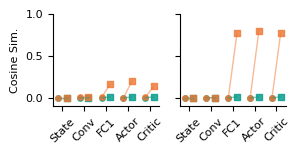

In [57]:
# make scatter plot for ppo_sims and ppo_init_sims
labels = ['State', 'Conv', 'FC1', 'Actor', 'Critic']
ppo_global_hom = [abs(x) for x in [ppo_hom_sims['state'][0], ppo_hom_sims['conv'][0], ppo_hom_sims['shared'][0], ppo_hom_sims['actor'][0], ppo_hom_sims['critic'][0]]]
ppo_local_hom = [abs(x) for x in [ppo_hom_sims['state'][1], ppo_hom_sims['conv'][1], ppo_hom_sims['shared'][1], ppo_hom_sims['actor'][1], ppo_hom_sims['critic'][1]]]
ppo_inits_global_hom = [abs(x) for x in [ppo_init_hom_sims['state'][0], ppo_init_hom_sims['conv'][0], ppo_init_hom_sims['shared'][0], ppo_init_hom_sims['actor'][0], ppo_init_hom_sims['critic'][0]]]
ppo_inits_local_hom = [abs(x) for x in [ppo_init_hom_sims['state'][1], ppo_init_hom_sims['conv'][1], ppo_init_hom_sims['shared'][1], ppo_init_hom_sims['actor'][1], ppo_init_hom_sims['critic'][1]]]

ppo_global_policy = [abs(x) for x in [ppo_policy_sims['state'][0], ppo_policy_sims['conv'][0], ppo_policy_sims['shared'][0], ppo_policy_sims['actor'][0], ppo_policy_sims['critic'][0]]]
ppo_local_policy = [abs(x) for x in [ppo_policy_sims['state'][1], ppo_policy_sims['conv'][1], ppo_policy_sims['shared'][1], ppo_policy_sims['actor'][1], ppo_policy_sims['critic'][1]]]
ppo_inits_global_policy = [abs(x) for x in [ppo_init_policy_sims['state'][0], ppo_init_policy_sims['conv'][0], ppo_init_policy_sims['shared'][0], ppo_init_policy_sims['actor'][0], ppo_init_policy_sims['critic'][0]]]
ppo_inits_local_policy = [abs(x) for x in [ppo_init_policy_sims['state'][1], ppo_init_policy_sims['conv'][1], ppo_init_policy_sims['shared'][1], ppo_init_policy_sims['actor'][1], ppo_init_policy_sims['critic'][1]]]

x = np.arange(len(labels))  # the label locations
offset = 0.2  # offset between global and local points

fig, axs = plt.subplots(1, 2, figsize=(3.0, 1.2), sharey=True)

# Plot global similarities
axs[0].scatter(x - offset, ppo_inits_global_hom, color=color_1, marker='o', s=15, label='Global sim. (init)', alpha=0.8)
axs[0].scatter(x + offset, ppo_global_hom, color=color_1, marker='s', s=15, label='Global sim. (trained)', alpha=0.8)

axs[1].scatter(x - offset, ppo_inits_global_policy, color=color_1, marker='o', s=15, label='Global sim. (init)', alpha=0.8)
axs[1].scatter(x + offset, ppo_global_policy, color=color_1, marker='s', s=15, label='Global sim. (trained)', alpha=0.8)

# Plot local similarities
axs[0].scatter(x - offset, ppo_inits_local_hom, color=color_2, marker='o', s=15, label='Within-label sim. (init)', alpha=0.8)
axs[0].scatter(x + offset, ppo_local_hom, color=color_2, marker='s', s=15, label='Within-label sim. (trained)', alpha=0.8)

axs[1].scatter(x - offset, ppo_inits_local_policy, color=color_2, marker='o', s=15, label='Within-label sim. (init)', alpha=0.8)
axs[1].scatter(x + offset, ppo_local_policy, color=color_2, marker='s', s=15, label='Within-label sim. (trained)', alpha=0.8)

# Connect init to trained with lines
for i in range(len(labels)):
    axs[0].plot([x[i] - offset, x[i] + offset], [ppo_inits_global_hom[i], ppo_global_hom[i]], color_1, alpha=0.5, linewidth=1)
    axs[0].plot([x[i] - offset, x[i] + offset], [ppo_inits_local_hom[i], ppo_local_hom[i]], color_2, alpha=0.5, linewidth=1)

    axs[1].plot([x[i] - offset, x[i] + offset], [ppo_inits_global_policy[i], ppo_global_policy[i]], color_1, alpha=0.5, linewidth=1)
    axs[1].plot([x[i] - offset, x[i] + offset], [ppo_inits_local_policy[i], ppo_local_policy[i]], color_2, alpha=0.5, linewidth=1)

# Add labels and formatting
axs[0].set_ylabel('Cosine Sim.', fontsize=8)
# axs[0].set_title('MDP abstr.', fontsize=10)
# axs[1].set_title('Policy abstr.', fontsize=10)
for ax in axs:
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=8, rotation=45)
axs[0].tick_params(axis='y', labelsize=8)
axs[0].set_ylim(-0.1, 1.0)
# axs[1].legend(frameon=False, fontsize=6, loc=(1.0, 0.3))

sns.despine()
# plt.tight_layout()
plt.show()

# save figure
fig.savefig('ppo_abstractions.pdf', transparent=True, bbox_inches='tight')